# SC2008 Computer Network

## Lab 4: Analyzing Network traffic log data using python

The objective of this laboratory session is to have a first hand experience in doing basic analysis of data log. Write simple python codes to decipher the network traffic data captured and stored as Microsoft Excel file (.csv). 

### Preparation
Import the necessary libraries.

In [1]:
%pip install seaborn
%pip install networkx
%pip install pandas
%pip install plotly


[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
import numpy as np
import pandas as pd
import seaborn as sb
import networkx as nx
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import time

In [3]:
# import data
df = pd.read_csv("SFlow_Data_lab4.csv")
print(f'Entries\'s shape (before): {df.shape}')
# drop the last coloumn that contain NaN
df = df.iloc[:, :-1]
print(f'Entries\'s shape (after): {df.shape}')

Entries's shape (before): (69369, 21)
Entries's shape (after): (69369, 20)


In [4]:
# add column headers for better understanding
df.columns = ["Type","sflow_agent_address","inputPort","outputPort", "src_MAC","dst_MAC",
              "ethernet_type","in_vlan","out_vlan", "src_IP","dst_IP","IP_protocol",
              "ip_tos","ip_ttl", "src_port_addr_tplayer","dst_port_addr_tplayer",
              "tcp_flags","packet_size","IP_size","sampling_rate"]

df

,Type,sflow_agent_address,inputPort,outputPort,src_MAC,dst_MAC,ethernet_type,in_vlan,out_vlan,src_IP,dst_IP,IP_protocol,ip_tos,ip_ttl,src_port_addr_tplayer,dst_port_addr_tplayer,tcp_flags,packet_size,IP_size,sampling_rate
0,FLOW,aa.aa.aa.aa,129,193,609c9f851b00,0031466b23cf,0x0800,11.0,919,155.69.160.32,64.233.188.128,6,0x00,56,23159.0,80,0x10,74,52,2048
1,FLOW,aa.aa.aa.aa,137,200,d404ff55fd4d,80711fc76001,0x0800,919.0,280,130.246.176.53,140.115.32.83,6,0x00,50,50041.0,20739,0x10,1518,1500,2048
2,FLOW,aa.aa.aa.aa,129,135,609c9f851b00,002688cd5fc7,0x0800,11.0,919,155.69.160.32,54.169.174.79,17,0x00,120,54241.0,26510,0x10,116,94,2048
3,FLOW,aa.aa.aa.aa,130,199,00239cd087c1,544b8cf9a7df,0x0800,919.0,600,137.132.228.15,193.62.192.8,6,0x00,56,53923.0,34262,0x10,70,52,2048
4,FLOW,aa.aa.aa.aa,129,135,609c9f851b00,002688cd5fc7,0x0800,11.0,919,155.69.160.32,54.255.221.151,17,0x00,120,55069.0,26509,0x10,113,91,2048
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69364,FLOW,aa.aa.aa.aa,258,199,204e71cf1b0f,ccef48570144,0x0800,537.0,601,207.241.228.157,210.48.222.9,6,0x00,56,443.0,57434,0x10,1522,1500,2048
69365,FLOW,aa.aa.aa.aa,131,193,00a742233e9e,0031466b23cf,0x0800,43.0,919,192.122.131.36,216.58.203.234,6,0x00,121,4920.0,443,0x10,1442,1420,2048
69366,FLOW,aa.aa.aa.aa,130,199,00239cd087c1,544b8cf9a7df,0x0800,919.0,600,137.132.228.15,193.62.192.8,6,0x00,56,34153.0,3123,0x10,82,64,2048
69367,FLOW,aa.aa.aa.aa,129,193,609c9f851b00,0031466b23cf,0x0800,11.0,919,155.69.196.9,74.125.56.6,17,0x00,58,56221.0,60786,0x10,1267,1245,2048


## Exercise 4A: TOP TALKERS AND LISTENERS

### 1. Top 5 Talkers
We aim to count the top 5 most frequent `src_IP` in the dataframe

In [5]:
srcIP_df = df["src_IP"].value_counts().rename_axis("IP Address").reset_index(name="Packets")
srcIP_df.index += 1
srcIP_df.head(5)

,IP Address,Packets
1,193.62.192.8,3041
2,155.69.160.32,2975
3,130.14.250.11,2604
4,14.139.196.58,2452
5,140.112.8.139,2056


Find out the Organisations who owned the correspond IP Addresses we obtained

In [6]:
def getOrg(data, col_name):
    organisation = []
    data[col_name]
    index = 0
    for ip in data[col_name]:
        time.sleep(1)
        if index == 5:
            break
        data = pd.read_json('http://ip-api.com/json/'+str(ip), typ='series')
        organisation.append(data['org'])
        index+=1
        
    return organisation

In [7]:
org = getOrg(srcIP_df, "IP Address")
for i in range(5):
    srcIP_df.loc[i+1, 'Organisation'] = org[i]

srcIP_df.head(5)

,IP Address,Packets,Organisation
1,193.62.192.8,3041,European Bioinformatics Institute
2,155.69.160.32,2975,Nanyang Technological University
3,130.14.250.11,2604,National Library of Medicine
4,14.139.196.58,2452,Indian Institute of Technology
5,140.112.8.139,2056,


### 2. Top 5 Listeners
We aim to count the top 5 most frequent `dst_IP` in the dataframe

In [8]:
dstIP_df = df["dst_IP"].value_counts().rename_axis("IP Address").reset_index(name="Packets")
dstIP_df.index += 1
org = getOrg(dstIP_df, "IP Address")
for i in range(5):
    dstIP_df.loc[i+1, 'Organisation'] = org[i]

dstIP_df.head(5)

,IP Address,Packets,Organisation
1,103.37.198.100,3841,A*STAR
2,137.132.228.15,3715,National University of Singapore
3,202.21.159.244,2446,Rpnet
4,192.101.107.153,2368,"Battelle Memorial Institute, Pacific Northwest..."
5,103.21.126.2,2056,Indian Institute of Technology Bombay


## Exercise 4B: TRANSPORT PROTOCOL 

Using the `IP_protocol` type attribute, we aim to determine the percentage of TCP and UDP protocol.

Based on the manual, we knew that **_TCP_** connection has value `6` and **_UDP_** connection has value `17`

In [9]:
protocol_df = df["IP_protocol"].value_counts().rename_axis("Header value").reset_index(name="# of Packets")
protocol_df.index+=1

# get the count for tcp and udp
tcp_df = protocol_df[protocol_df["Header value"]==6]
ucp_df = protocol_df[protocol_df["Header value"]==17]
total_packet = df["IP_protocol"].count()
total_df = pd.DataFrame({"Header value": ["Total"], "# of Packets": [total_packet]})
tcp_udp_df = pd.concat([tcp_df,ucp_df,total_df]).reset_index(drop=True)

tcp_udp_df.insert(1,"Transport layer protocol", ["TCP", "UDP", "All"])
tcp_udp_df.index += 1


In [10]:
# find percentage
TCPnum = int(tcp_udp_df[tcp_udp_df["Transport layer protocol"]=='TCP']['# of Packets'])
UDPnum = int(tcp_udp_df[tcp_udp_df["Transport layer protocol"]=='UDP']['# of Packets'])
totalnum = int(tcp_udp_df[tcp_udp_df["Transport layer protocol"]=='All']['# of Packets'])

TCP_percentage = TCPnum / totalnum * 100
UDP_percentage = UDPnum / totalnum * 100
ALL_percentage = totalnum / totalnum * 100

tcp_udp_df.insert(3, "Percentage (%)", [TCP_percentage, UDP_percentage, ALL_percentage])
tcp_udp_df


,Header value,Transport layer protocol,# of Packets,Percentage (%)
1,6,TCP,56063,80.818521
2,17,UDP,9462,13.640099
3,Total,All,69369,100.000000


## Exercise 4C: APPLICATIONS PROTOCOL

Using the destination IP port number, ie. `dst_port_addr_tplayer` type attribute, to determine the top 5 most frequently used application protocol.

In [11]:
dst_port_df = df['dst_port_addr_tplayer'].value_counts().rename_axis('Destination IP port number').reset_index(name = "# of packets")
dst_port_df.index+=1
dst_port_df.sort_values('# of packets', ascending = False)

# find the Services correpsond to the Destination IP port number
services = ["https", "http", "Dynamic and/or Private Ports", "Unassigned", "Dynamic and/or Private Ports"]
for i in range(5):
    dst_port_df.loc[i+1, 'Service'] = services[i]

dst_port_df.head(5)

,Destination IP port number,# of packets,Service
1,443,13423,https
2,80,2647,http
3,52866,2068,Dynamic and/or Private Ports
4,45512,1356,Unassigned
5,56152,1341,Dynamic and/or Private Ports


## Exercise 4D: Traffic

The traffic intensity is an important parameter that a network engineer needs to monitor closely to determine if there is congestion (simply by comparing traffic to bandwidth). We will be using the IP packet size, ie. `IP_size` type attribute, to calculate the estimated total traffic over the monitored period of 15 seconds. (Assume the sampling rate is 1 in 2048)  

In [12]:
# assume the units is bytes
packetSize = df["packet_size"].sum()
# convert to MB
packetSize_MB = packetSize/(8*1024*1024)
print(f'The network traffic over the monitored period of 15s: {packetSize_MB:.3f}MB')

# repeat the same process, let's see how much IP bytes are being sent out
IPtraffic = df["IP_size"].sum()
IPtraffic_MB = IPtraffic/(8*1024*1024)
print(f'The IP traffic over the monitored period of 15s: {IPtraffic_MB:.3f}MB')

MACheader = (1-(IPtraffic_MB/packetSize_MB)) * 100
print(f'Percentage of MAC header as part of network traffic: {MACheader:.3f}%')

The network traffic over the monitored period of 15s: 4444.585MB
The IP traffic over the monitored period of 15s: 7.722MB
Percentage of MAC header as part of network traffic: 99.826%


## Exercise 4E: ADDITIONAL ANALYSIS

### 1. Top 5 Communication Pairs

In [20]:
# get the top 5 communication pairs
pair = df.groupby(['src_IP', 'dst_IP']).size().reset_index(name = 'Number of times paired')
pair = pair.sort_values('Number of times paired', ascending=False).reset_index()
pair.drop('index',axis='columns',inplace=True)

# find the corresponding organisation
srcOrg = getOrg(pair, "src_IP")
dstOrg = getOrg(pair, "dst_IP")

for i in range(5):
    pair.loc[i, 'Source Organisation'] = srcOrg[i]
    pair.loc[i, 'Destination Organisation'] = dstOrg[i]

pair.loc[3, 'Source Organisation'] = "Taiwan Academic Network"
pair.index+=1
pair.head(5)


,src_IP,dst_IP,Number of times paired,Source Organisation,Destination Organisation
1,193.62.192.8,137.132.228.15,3041,European Bioinformatics Institute,National University of Singapore
2,130.14.250.11,103.37.198.100,2599,National Library of Medicine,A*STAR
3,14.139.196.58,192.101.107.153,2368,Indian Institute of Technology,"Battelle Memorial Institute, Pacific Northwest..."
4,140.112.8.139,103.21.126.2,2056,Taiwan Academic Network,Indian Institute of Technology Bombay
5,137.132.228.15,193.62.192.8,1910,National University of Singapore,European Bioinformatics Institute


Using the top paired communication pair,

<Axes: xlabel='time'>

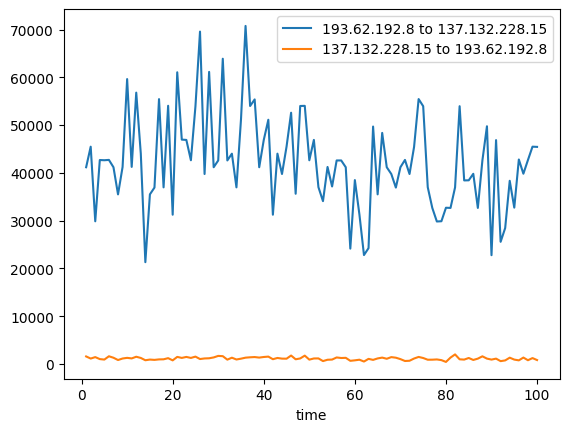

In [14]:
part = np.array_split(df,100)
part2 = part

trafficR = pd.DataFrame(columns=['time', '193.62.192.8 to 137.132.228.15'])
for i,part in enumerate(part):
    trafficR.loc[i] = [i+1, part[(part['src_IP'] == '193.62.192.8') & (part['dst_IP'] == '137.132.228.15')]['IP_size'].sum()]
    
trafficL = pd.DataFrame(columns=['time', '137.132.228.15 to 193.62.192.8'])
for i,part2 in enumerate(part2):
    trafficL.loc[i] = [i+1, part2[(part2['src_IP'] == '137.132.228.15') & (part2['dst_IP'] == '193.62.192.8')]['IP_size'].sum()]
    
graph = trafficR.plot(x='time', y='193.62.192.8 to 137.132.228.15')
trafficL.plot(x='time', y='137.132.228.15 to 193.62.192.8', ax = graph)

### 2. Visualizing of communications between different IP hosts

We will reuse the `pair` dataframe to visualize the host-to-host communications

In [15]:
pair_list = df.groupby(['src_IP','dst_IP']).count()
pair_list = pd.DataFrame(pair_list['Type'])
pair_list.sort_values(by='Type',ascending=False,inplace=True)
pair_list.columns=["count"]
pair_list.head(5)

,,count
src_IP,dst_IP,
193.62.192.8,137.132.228.15,3041
130.14.250.11,103.37.198.100,2599
14.139.196.58,192.101.107.153,2368
140.112.8.139,103.21.126.2,2056
137.132.228.15,193.62.192.8,1910


In [16]:
pair_list_out = list(pair_list.index)

# build a graph based on the IP pair
graph2 = nx.Graph()
count = 0
for i in pair_list_out:
    graph2.add_edge(i[0],i[1])
    count+=1  
count

6589

In [17]:
%pip install scipy

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [18]:
# ignore all the matplotlidDeprecationWarnings
import warnings
warnings.filterwarnings("ignore")

plt.figure(2,figsize=(100,100))
nx.draw(graph2, with_labels = True, font_size = 10)
plt.show()

### 3. Peak Traffic of Network

Another network graph to visualize `src_IP` to `dst_IP`

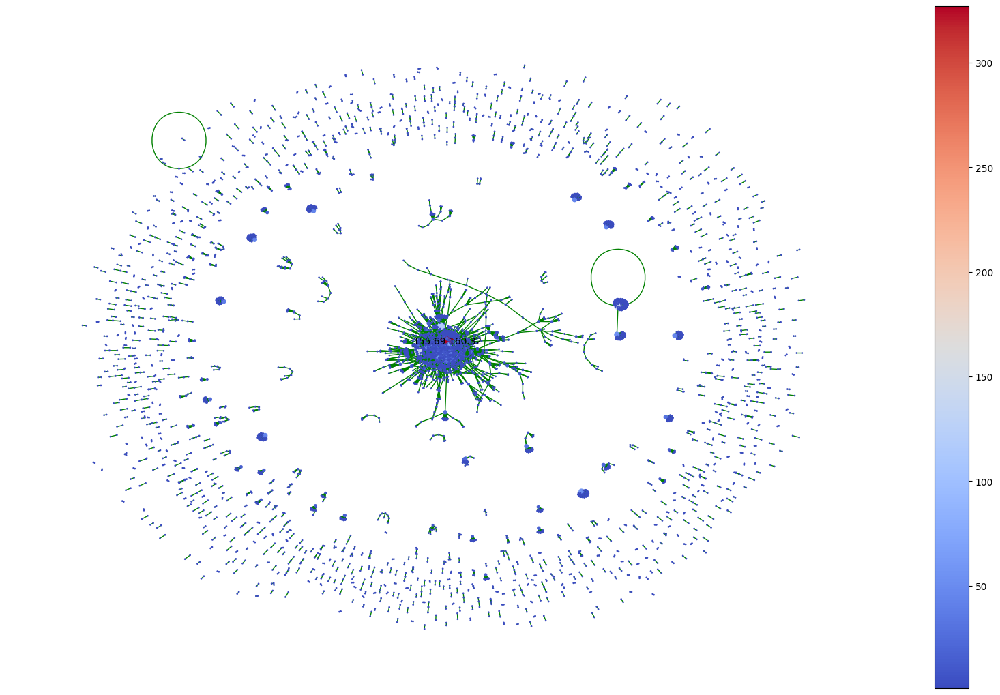

In [19]:
#plt.figure(2,figsize=(80,80))
graph3 = nx.Graph()
graph3 = nx.from_pandas_edgelist(df, 'src_IP', 'dst_IP')

dic = dict(graph3.degree)
degrees = graph3.degree()
nodes = graph3.nodes()
maximum = dic[max(dic, key=dic.get)]
minimum = dic[min(dic, key=dic.get)]
Ncolor = np.asarray([degrees[n]/maximum*20 for n in nodes])
cmap = plt.cm.coolwarm

# only label nodes with degree > 100
label = {n:(n if dic[n] > 300 else '') for n in nodes}
plt.figure(3,figsize=(16,10)) 
nx.draw_spring(graph3, node_size=[(v+1)/maximum*150 for v in dic.values()], node_color=Ncolor,
               cmap=cmap, with_labels=True, labels=label, edge_color='green', font_size=10)

sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=minimum, vmax=maximum))
plt.colorbar(sm)
plt.show()
